In [2]:
import torch
import matplotlib.pyplot as plt
import numpy as np

from src.visualize import show_mask, show_points, show_box
# Import the modules we just built
from src.dataset import KittiMotsDataset
from src.models.sam_wrapper import SAMWrapper
from src.prompts import get_prompts
from src.visualize import plot_prediction

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

/ghome/group05/miniconda3/envs/c5/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cpu


In [3]:
# Path to your KITTI-MOTS dataset
data_dir = "/home/mcv/datasets/C5/KITTI-MOTS/" 

# default_val = ["0002", "0006", "0007", "0008", "0010", "0013", "0014", "0016", "0018"]
# Initialize the dataset (make sure return_masks=True so we can generate points!)
val_dataset = KittiMotsDataset(root_dir=data_dir, split="val", return_masks=True)
print(f"Loaded {len(val_dataset)} validation images.")

# Initialize SAM Wrapper
print("Loading SAM model (this might take a few seconds)...")
wrapper = SAMWrapper(device=device)
print("SAM Model loaded successfully!")

Loaded 2981 validation images.
Loading SAM model (this might take a few seconds)...


The image processor of type `SamImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 
Loading weights: 100%|██████████| 314/314 [00:00<00:00, 852.47it/s, Materializing param=vision_encoder.pos_embed]                                                  


SAM Model loaded successfully!


In [8]:
import matplotlib.pyplot as plt
import numpy as np
from src.visualize import show_mask, show_box

def plot_gt_vs_pred(image, gt_target, pred_masks, pred_boxes, pred_labels, pred_scores, title="", pred_title="Predictions"):
    """
    Plots a 1x2 grid. Left: Ground Truth | Right: Predictions (YOLO+SAM or GroundedSAM)
    """
    
    # -----------------------------------------
    # PANEL 1: GROUND TRUTH
    # -----------------------------------------
    plt.figure(figsize=(14, 6)) # Adjusted figsize for a single panoramic image
    if title:
        plt.suptitle(title, fontsize=20, fontweight='bold', y=1.02)
        
    plt.imshow(image)
    plt.title("Ground Truth Annotations", fontsize=18)
    plt.axis('off')
    
    ax1 = plt.gca() # Get current axis
    
    gt_boxes = gt_target["boxes"].numpy()
    gt_masks = gt_target["masks"].numpy()
    gt_labels = gt_target["labels"].numpy()
    
    for i in range(len(gt_boxes)):
        color = np.random.rand(3)
        show_box(gt_boxes[i], ax1, edgecolor=color)
        if len(gt_masks) > 0:
            show_mask(gt_masks[i], ax1, random_color=False, color=color)
        
        lbl_text = "Car" if gt_labels[i] == 3 else ("Pedestrian" if gt_labels[i] == 1 else str(gt_labels[i]))
        ax1.text(gt_boxes[i][0], gt_boxes[i][1] - 5, lbl_text, color=color, fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show() # Renders and closes the first figure
    # -----------------------------------------
    # PANEL 2: PREDICTIONS
    # -----------------------------------------
    plt.figure(figsize=(14, 6))
    if title:
        plt.suptitle(title, fontsize=20, fontweight='bold', y=1.02)
        
    plt.imshow(image)
    plt.title("Grounded SAM ('car . person .')", fontsize=18)
    plt.axis('off')

    ax2 = plt.gca() # Get current axis for the new figure
    
    for i in range(len(pred_masks)):
        color = np.random.rand(3)
        show_box(pred_boxes[i], ax2, edgecolor=color)
        show_mask(pred_masks[i], ax2, random_color=False, color=color)
        
        # If labels are ints (1 or 3), map them to strings
        if isinstance(pred_labels[i], (int, np.integer)):
             lbl_str = "Car" if pred_labels[i] == 3 else "Pedestrian"
        else:
             lbl_str = str(pred_labels[i])
             
        # Only show score if it's not None
        score_text = f" ({pred_scores[i]:.2f})" if pred_scores[i] is not None else ""
        lbl_text = f"{lbl_str}{score_text}"
        
        ax2.text(pred_boxes[i][0], pred_boxes[i][1] - 5, lbl_text, color=color, fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


def show_mask(mask, ax, random_color=False, color=None):
    """Applies a mask overlay to a matplotlib axis."""
    if color is not None:
        # If the user provides a custom color, ensure it has an alpha channel
        color = np.array(color)
        if len(color) == 3:
            color = np.concatenate([color, np.array([0.6])], axis=0)
    elif random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        # Default blue-ish color with alpha=0.6
        color = np.array([30/255, 144/255, 255/255, 0.6])
        
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=200, color=None):
    """Plots positive (custom/green) and negative (red) prompt points."""
    coords = np.array(coords)
    labels = np.array(labels)
    
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    
    # Use the custom color for positive points if provided, otherwise default to green
    pos_color = color if color is not None else 'green'
    
    if len(pos_points) > 0:
        ax.scatter(pos_points[:, 0], pos_points[:, 1], color=pos_color, marker='*', 
                   s=marker_size, edgecolor='white', linewidth=1.25)
    if len(neg_points) > 0:
        ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', 
                   s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax, edgecolor='green'):
    """Plots a bounding box."""
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor=edgecolor, facecolor=(0,0,0,0), lw=2))

def plot_prediction(image, masks, points=None, labels=None, boxes=None, title="", figsize=(10, 10)):
    """
    High-level function ideal for Jupyter Notebooks.
    Call this and it will render the matplotlib plot inline.
    """
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(image)
    
    # Plot all masks
    for mask in masks:
        show_mask(mask, ax, random_color=True)
        
    # Plot points if provided
    if points is not None and labels is not None:
        for pt_group, lbl_group in zip(points, labels):
            show_points(pt_group, lbl_group, ax)
            
    # Plot boxes if provided
    if boxes is not None:
        for box in boxes:
            show_box(box, ax)
            
    ax.set_title(title)
    ax.axis('off')
    plt.show()

/home/mcv/datasets/C5/KITTI-MOTS/training/image_02/0014/000082.png
Received prompt_kwargs: {'input_boxes': [[[[793.9682006835938, 182.24685668945312, 1047.25732421875, 320.1660461425781], [691.10791015625, 177.41049194335938, 756.1957397460938, 230.1229705810547], [954.9645385742188, 225.36256408691406, 1224.0, 367.5954284667969], [480.1765441894531, 174.3009490966797, 513.7728271484375, 195.8211669921875]]]]}
Processed inputs: {'pixel_values': torch.Size([1, 3, 1024, 1024]), 'original_sizes': torch.Size([1, 2]), 'reshaped_input_sizes': torch.Size([1, 2]), 'input_boxes': torch.Size([1, 4, 4])}


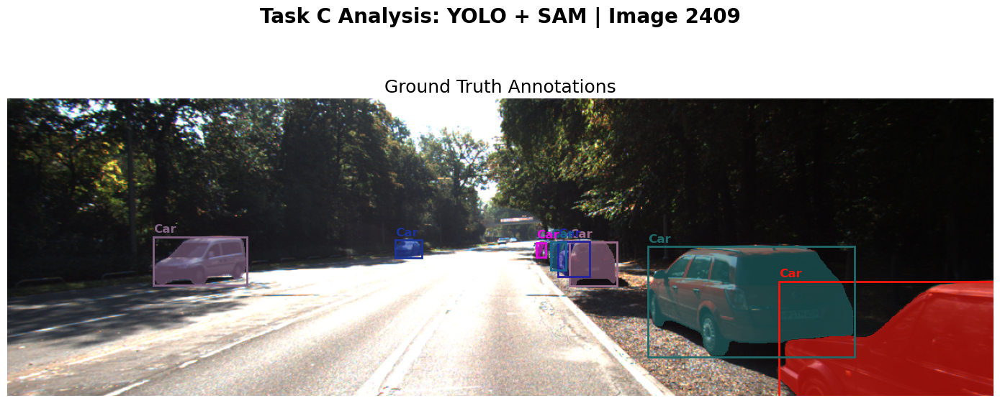

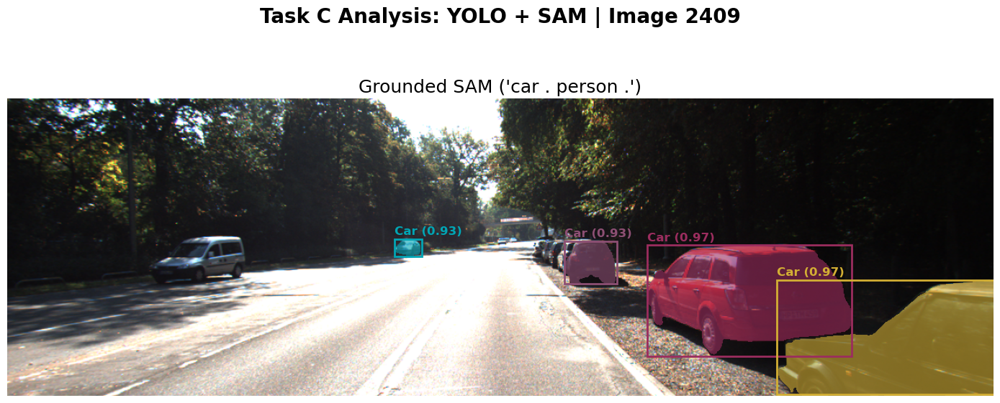

In [9]:
from src.prompts import get_prompts

# 1. Define your config containing the path to your Week 1 JSON
config_yolo = {
    "week1_predictions_path": "/ghome/group05/alvaro/MCV-C5/Task2/best_model_w1/week1_yolo_predictions.json", # <--- UPDATE THIS PATH
    "custom_box_threshold": 0.5 # Play with this! Lower it to see YOLO's false positives.
}

# 2. Hunt for the perfect image
image_idx = 2409 # Change this to find the best examples!
image, target = val_dataset[image_idx]

# 3. Extract the YOLO boxes for this frame using your router
prompt_kwargs, yolo_labels = get_prompts(
    target, 
    prompt_type="custom_bbox", 
    config=config_yolo
)

# 4. Run SAM inference (only if YOLO actually found something!)
if prompt_kwargs:
    # Use the base SAM wrapper we wrote
    pred_masks, pred_scores = wrapper.predict(image, prompt_kwargs)
    
    # Extract the boxes from the heavily nested prompt_kwargs so we can plot them
    # format is: {"input_boxes": [[[ [x1,y1,x2,y2], ... ]]]}
    yolo_boxes = prompt_kwargs["input_boxes"][0][0]
    
    # 5. Plot Side-by-Side!
    plot_gt_vs_pred(
        image=image, 
        gt_target=target, 
        pred_masks=pred_masks, 
        pred_boxes=yolo_boxes, 
        pred_labels=yolo_labels, 
        pred_scores=pred_scores, # SAM's mask confidence scores
        title=f"Task C Analysis: YOLO + SAM | Image {image_idx}",
        pred_title=f"YOLO Boxes + SAM Masks (Conf > {config_yolo['custom_box_threshold']})"
    )
else:
    print(f"YOLO did not detect any objects in image {image_idx} above the threshold!")

/home/mcv/datasets/C5/KITTI-MOTS/training/image_02/0016/000089.png
Received prompt_kwargs: {'input_boxes': [[[[708.2522583007812, 163.0985107421875, 742.5943603515625, 278.5972595214844], [527.197998046875, 165.08847045898438, 564.9473266601562, 279.80352783203125], [668.230712890625, 157.36819458007812, 713.1015014648438, 288.16046142578125], [567.3413696289062, 170.24087524414062, 604.9254760742188, 273.5701904296875], [465.9371032714844, 161.16156005859375, 493.6825256347656, 257.2733459472656], [1054.1453857421875, 186.32664489746094, 1153.0084228515625, 223.55274963378906], [962.0185546875, 185.36631774902344, 1064.0172119140625, 221.66744995117188], [479.5062255859375, 159.60536193847656, 520.4986572265625, 286.583251953125], [404.0529479980469, 162.42898559570312, 444.6854553222656, 266.5007629394531], [433.24658203125, 163.67254638671875, 464.3533630371094, 252.1616973876953], [196.09585571289062, 154.4095458984375, 212.22940063476562, 197.95855712890625], [1130.055419921875, 1

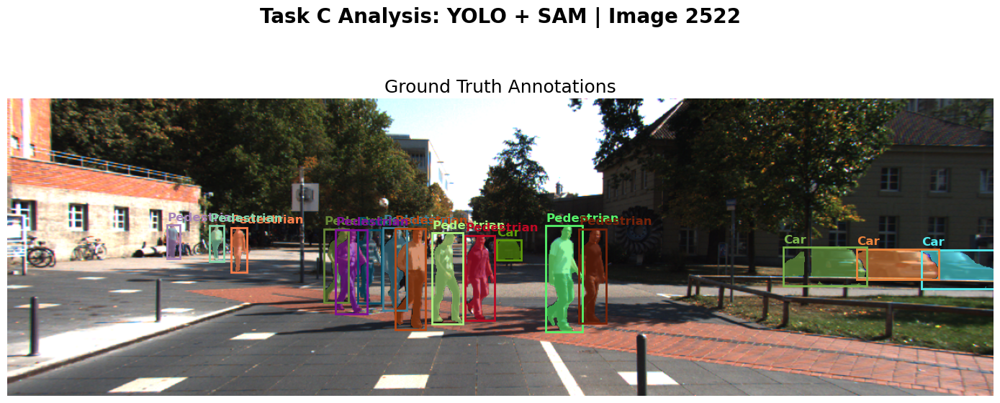

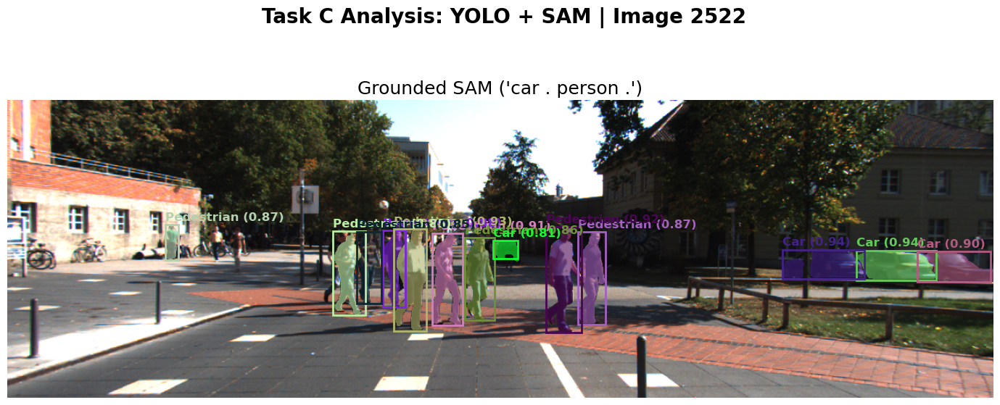

In [10]:
from src.prompts import get_prompts

# 1. Define your config containing the path to your Week 1 JSON
config_yolo = {
    "week1_predictions_path": "/ghome/group05/alvaro/MCV-C5/Task2/best_model_w1/week1_yolo_predictions.json", # <--- UPDATE THIS PATH
    "custom_box_threshold": 0.5 # Play with this! Lower it to see YOLO's false positives.
}

# 2. Hunt for the perfect image
image_idx = 2522 # Change this to find the best examples!
image, target = val_dataset[image_idx]

# 3. Extract the YOLO boxes for this frame using your router
prompt_kwargs, yolo_labels = get_prompts(
    target, 
    prompt_type="custom_bbox", 
    config=config_yolo
)

# 4. Run SAM inference (only if YOLO actually found something!)
if prompt_kwargs:
    # Use the base SAM wrapper we wrote
    pred_masks, pred_scores = wrapper.predict(image, prompt_kwargs)
    
    # Extract the boxes from the heavily nested prompt_kwargs so we can plot them
    # format is: {"input_boxes": [[[ [x1,y1,x2,y2], ... ]]]}
    yolo_boxes = prompt_kwargs["input_boxes"][0][0]
    
    # 5. Plot Side-by-Side!
    plot_gt_vs_pred(
        image=image, 
        gt_target=target, 
        pred_masks=pred_masks, 
        pred_boxes=yolo_boxes, 
        pred_labels=yolo_labels, 
        pred_scores=pred_scores, # SAM's mask confidence scores
        title=f"Task C Analysis: YOLO + SAM | Image {image_idx}",
        pred_title=f"YOLO Boxes + SAM Masks (Conf > {config_yolo['custom_box_threshold']})"
    )
else:
    print(f"YOLO did not detect any objects in image {image_idx} above the threshold!")

/home/mcv/datasets/C5/KITTI-MOTS/training/image_02/0002/000216.png
Received prompt_kwargs: {'input_boxes': [[[[990.9059448242188, 169.6537322998047, 1116.3570556640625, 202.9075927734375], [289.5049133300781, 180.76316833496094, 327.3826904296875, 272.81646728515625]]]]}
Processed inputs: {'pixel_values': torch.Size([1, 3, 1024, 1024]), 'original_sizes': torch.Size([1, 2]), 'reshaped_input_sizes': torch.Size([1, 2]), 'input_boxes': torch.Size([1, 2, 4])}


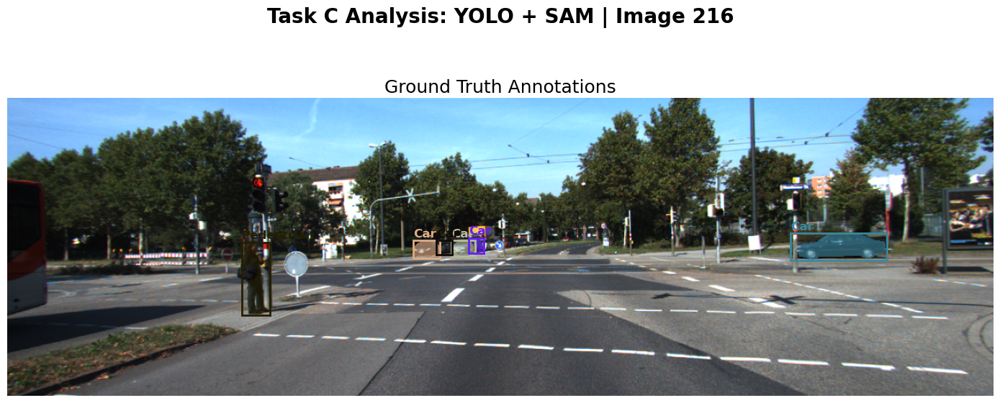

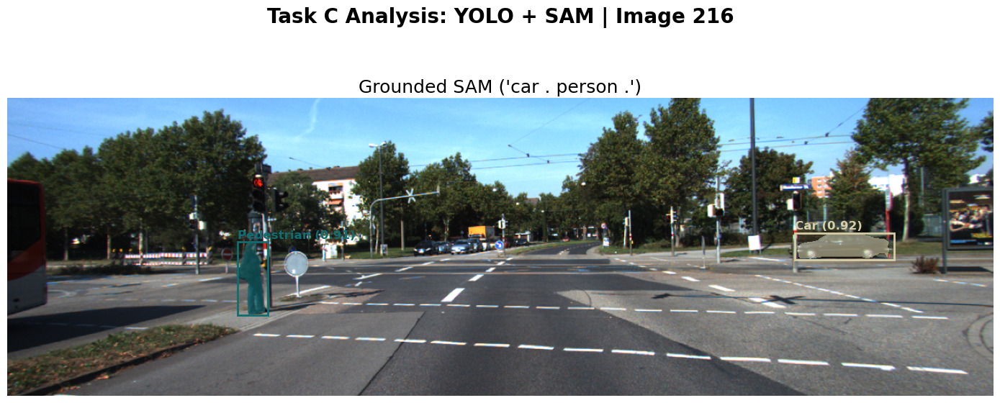

In [12]:
from src.prompts import get_prompts

# 1. Define your config containing the path to your Week 1 JSON
config_yolo = {
    "week1_predictions_path": "/ghome/group05/alvaro/MCV-C5/Task2/best_model_w1/week1_yolo_predictions.json", # <--- UPDATE THIS PATH
    "custom_box_threshold": 0.5 # Play with this! Lower it to see YOLO's false positives.
}

# 2. Hunt for the perfect image
image_idx = 216 # Change this to find the best examples!
image, target = val_dataset[image_idx]

# 3. Extract the YOLO boxes for this frame using your router
prompt_kwargs, yolo_labels = get_prompts(
    target, 
    prompt_type="custom_bbox", 
    config=config_yolo
)

# 4. Run SAM inference (only if YOLO actually found something!)
if prompt_kwargs:
    # Use the base SAM wrapper we wrote
    pred_masks, pred_scores = wrapper.predict(image, prompt_kwargs)
    
    # Extract the boxes from the heavily nested prompt_kwargs so we can plot them
    # format is: {"input_boxes": [[[ [x1,y1,x2,y2], ... ]]]}
    yolo_boxes = prompt_kwargs["input_boxes"][0][0]
    
    # 5. Plot Side-by-Side!
    plot_gt_vs_pred(
        image=image, 
        gt_target=target, 
        pred_masks=pred_masks, 
        pred_boxes=yolo_boxes, 
        pred_labels=yolo_labels, 
        pred_scores=pred_scores, # SAM's mask confidence scores
        title=f"Task C Analysis: YOLO + SAM | Image {image_idx}",
        pred_title=f"YOLO Boxes + SAM Masks (Conf > {config_yolo['custom_box_threshold']})"
    )
else:
    print(f"YOLO did not detect any objects in image {image_idx} above the threshold!")

/home/mcv/datasets/C5/KITTI-MOTS/training/image_02/0008/000005.png
Received prompt_kwargs: {'input_boxes': [[[[372.9694519042969, 187.0992431640625, 430.311279296875, 220.40565490722656], [114.16380310058594, 185.1317901611328, 290.2453308105469, 266.96649169921875]]]]}
Processed inputs: {'pixel_values': torch.Size([1, 3, 1024, 1024]), 'original_sizes': torch.Size([1, 2]), 'reshaped_input_sizes': torch.Size([1, 2]), 'input_boxes': torch.Size([1, 2, 4])}


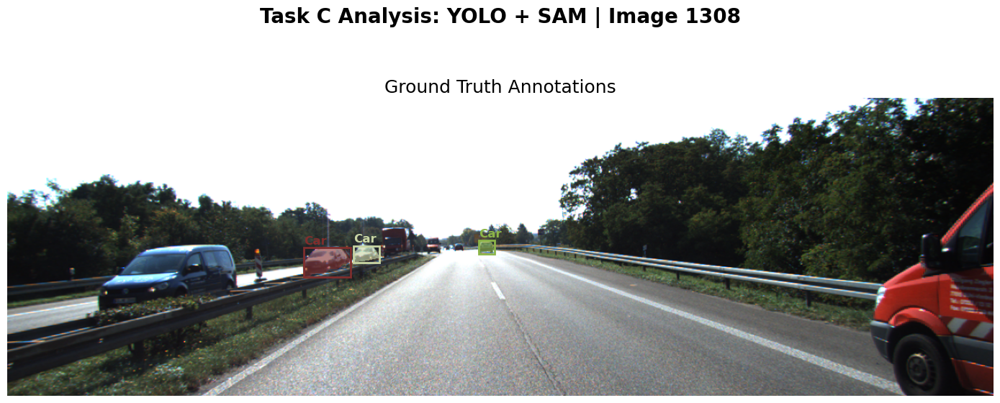

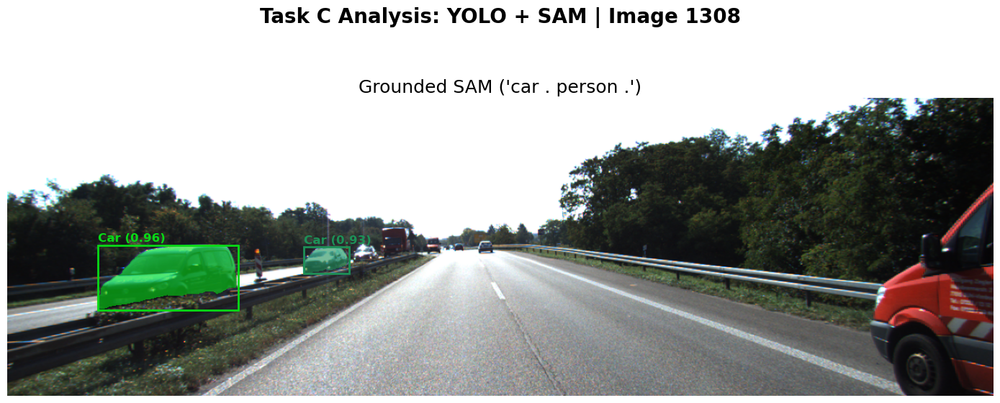

In [11]:
from src.prompts import get_prompts

# 1. Define your config containing the path to your Week 1 JSON
config_yolo = {
    "week1_predictions_path": "/ghome/group05/alvaro/MCV-C5/Task2/best_model_w1/week1_yolo_predictions.json", # <--- UPDATE THIS PATH
    "custom_box_threshold": 0.5 # Play with this! Lower it to see YOLO's false positives.
}

# 2. Hunt for the perfect image
image_idx = 1308 # Change this to find the best examples!
image, target = val_dataset[image_idx]

# 3. Extract the YOLO boxes for this frame using your router
prompt_kwargs, yolo_labels = get_prompts(
    target, 
    prompt_type="custom_bbox", 
    config=config_yolo
)

# 4. Run SAM inference (only if YOLO actually found something!)
if prompt_kwargs:
    # Use the base SAM wrapper we wrote
    pred_masks, pred_scores = wrapper.predict(image, prompt_kwargs)
    
    # Extract the boxes from the heavily nested prompt_kwargs so we can plot them
    # format is: {"input_boxes": [[[ [x1,y1,x2,y2], ... ]]]}
    yolo_boxes = prompt_kwargs["input_boxes"][0][0]
    
    # 5. Plot Side-by-Side!
    plot_gt_vs_pred(
        image=image, 
        gt_target=target, 
        pred_masks=pred_masks, 
        pred_boxes=yolo_boxes, 
        pred_labels=yolo_labels, 
        pred_scores=pred_scores, # SAM's mask confidence scores
        title=f"Task C Analysis: YOLO + SAM | Image {image_idx}",
        pred_title=f"YOLO Boxes + SAM Masks (Conf > {config_yolo['custom_box_threshold']})"
    )
else:
    print(f"YOLO did not detect any objects in image {image_idx} above the threshold!")